<a href="https://colab.research.google.com/github/tainangao/Cybersecurity/blob/master/Copy_of_WEEK_3_FRAUD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
! pip install -q kaggle
from google.colab import files
files.upload()

In [0]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle competitions download -c 'ieee-fraud-detection'

In [0]:
!unzip test_identity.csv.zip
!unzip test_transaction.csv.zip
!unzip train_identity.csv.zip
!unzip train_transaction.csv.zip
!unzip sample_submission.csv.zip

In [0]:
# From kernel https://www.kaggle.com/gemartin/load-data-reduce-memory-usage

def reduce_mem_usage(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2    
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)    
    end_mem = df.memory_usage().sum() / 1024**2
    if verbose: print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df

In [0]:
import warnings
warnings.simplefilter('ignore')


import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)


import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
mpl.style.use(['seaborn-pastel']) 


# Preprocessing, modelling and evaluating
from sklearn import preprocessing
import xgboost as xgb
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, roc_auc_score
from sklearn.model_selection import StratifiedKFold, cross_val_score, KFold, train_test_split

## Hyperopt modules
from hyperopt import fmin, hp, tpe, Trials, space_eval, STATUS_OK, STATUS_RUNNING
from functools import partial

import os
import gc
# print(os.listdir("../input"))



In [7]:
%%time
warnings.simplefilter('ignore')
files = ['test_identity.csv', 
         'test_transaction.csv',
         'train_identity.csv',
         'train_transaction.csv',
         'sample_submission.csv']

def load_data(file):
    return reduce_mem_usage(pd.read_csv(file))
    
import multiprocessing
with multiprocessing.Pool() as pool:
    test_id, test_trn, train_id, train_trn, sample_submission = pool.map(load_data, files)

Mem. usage decreased to 25.44 Mb (42.7% reduction)
Mem. usage decreased to 25.86 Mb (42.7% reduction)
Mem. usage decreased to  2.90 Mb (62.5% reduction)
Mem. usage decreased to 472.59 Mb (68.9% reduction)
Mem. usage decreased to 542.35 Mb (69.4% reduction)
CPU times: user 1.9 s, sys: 1.41 s, total: 3.3 s
Wall time: 2min 15s


In [8]:
print('train_trn shape is {}'.format(train_trn.shape))
print('test_trn shape is {}'.format(test_trn.shape))
print('train_id shape is {}'.format(train_id.shape))
print('test_id shape is {}'.format(test_id.shape))

train_trn shape is (590540, 394)
test_trn shape is (506691, 393)
train_id shape is (144233, 41)
test_id shape is (141907, 41)


In [9]:
train_trn.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,...,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.0,NaN,outlook.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,debit,476.0,87.0,NaN,NaN,yahoo.com,NaN,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,50.0,1758.0,925.0,0.0,354.0,0.0,135.0,0.0,0.0,0.0,50.0,1404.0,790.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,credit,420.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [10]:
train_id.head()

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.0,NotFound,NaN,-480.0,New,NotFound,166.0,NaN,542.0,144.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,Android 7.0,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
1,2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,100.0,NotFound,49.0,-300.0,New,NotFound,166.0,NaN,621.0,500.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,iOS 11.1.2,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device
2,2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,100.0,NotFound,52.0,NaN,Found,Found,121.0,NaN,410.0,142.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,NaN,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,Windows
3,2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,NaN,100.0,NotFound,52.0,NaN,New,NotFound,225.0,NaN,176.0,507.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,NaN,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,NaN
4,2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,0.0,100.0,NotFound,NaN,-300.0,Found,Found,166.0,15.0,529.0,575.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,Mac OS X 10_11_6,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T,desktop,MacOS


# EDA 

More to work on?
- card3, card5
- P_emaildomain, R_emaildomain

In [11]:
# What's the target?

[c for c in train_trn.columns if c not in test_trn.columns]

['isFraud']

0    0.96501
1    0.03499
Name: isFraud, dtype: float64


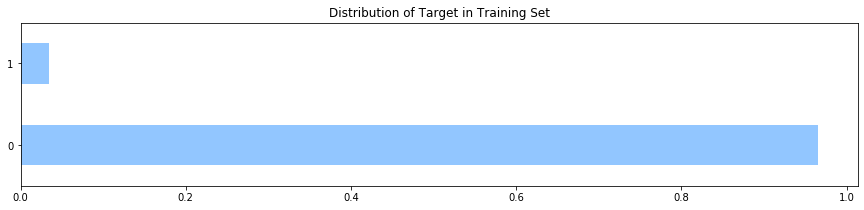

In [12]:
target = train_trn['isFraud'].value_counts(normalize=True)
print (target)

target.plot(kind='barh', figsize=(15,3), title='Distribution of Target in Training Set')
plt.show()

### Quantiles of Fraud and Non Fraud Transactions

In [13]:
a = train_trn[train_trn['isFraud']==1]['TransactionAmt'].quantile([.01, .1, .25, .5, .75, .9, .99])
b = train_trn[train_trn['isFraud']==0]['TransactionAmt'].quantile([.01, .1, .25, .5, .75, .9, .99])

pd.concat([a,b], axis=1, keys=['Fraud', "Non Fraud"])

,Fraud,Non Fraud
0.01,6.739453,9.511875
0.10,18.937500,26.312500
0.25,35.031250,43.968750
0.50,75.000000,68.500000
0.75,161.000000,120.000000
0.90,335.000000,267.100000
0.99,994.000000,1104.000000


## TransactionDT

In [14]:
train_trn['TransactionDT'].sample(5)

187110     4158695
165273     3525157
314726     7843719
230489     5455037
532899    14049230
Name: TransactionDT, dtype: int32

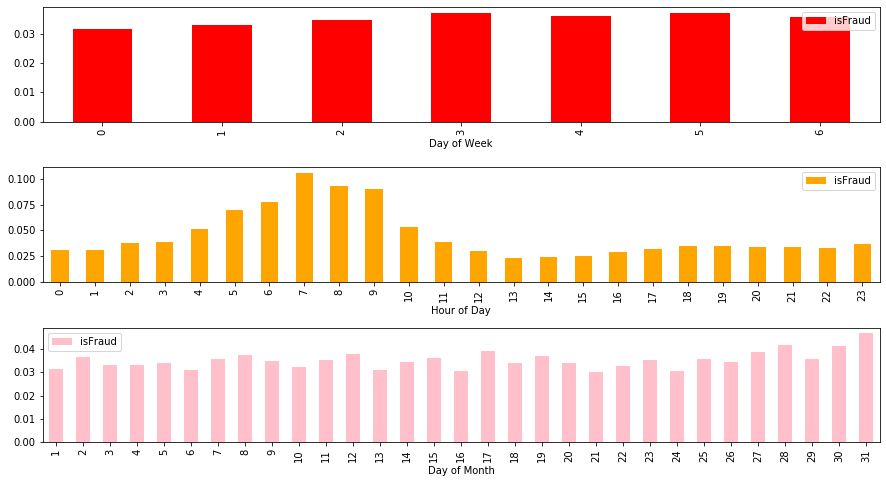

In [15]:
import datetime as dt

START_DATE = '2017-11-30'
startdate = dt.datetime.strptime(START_DATE, "%Y-%m-%d")
train_trn['date'] = train_trn['TransactionDT'].apply(lambda x: (startdate + dt.timedelta(seconds=x)))

train_trn['weekdays']=train_trn['date'].dt.dayofweek
train_trn['hours']=train_trn['date'].dt.hour
train_trn['days']=train_trn['date'].dt.day

fig = plt.figure(figsize=(15,8))

ax0 = fig.add_subplot(3, 1, 1) # add subplot 1 (3 rows, 1 column, first plot)
ax1 = fig.add_subplot(3, 1, 2) # add subplot 2 (3 rows, 1 column, second plot)
ax2 = fig.add_subplot(3, 1, 3) # add subplot 3 (3 rows, 1 column, third plot)

# Subplot 1
train_trn.groupby('weekdays')['isFraud'].mean().to_frame().plot(kind='bar', color='red', ax=ax0)
ax0.set_xlabel('Day of Week')

# Subplot 2
train_trn.groupby('hours')['isFraud'].mean().to_frame().plot(kind='bar', color='orange', ax=ax1)
ax1.set_xlabel('Hour of Day')

# Subplot 3
train_trn.groupby('days')['isFraud'].mean().to_frame().plot(kind='bar', color='pink', ax=ax2)
ax2.set_xlabel('Day of Month')

plt.subplots_adjust(hspace = 0.4)
plt.show()

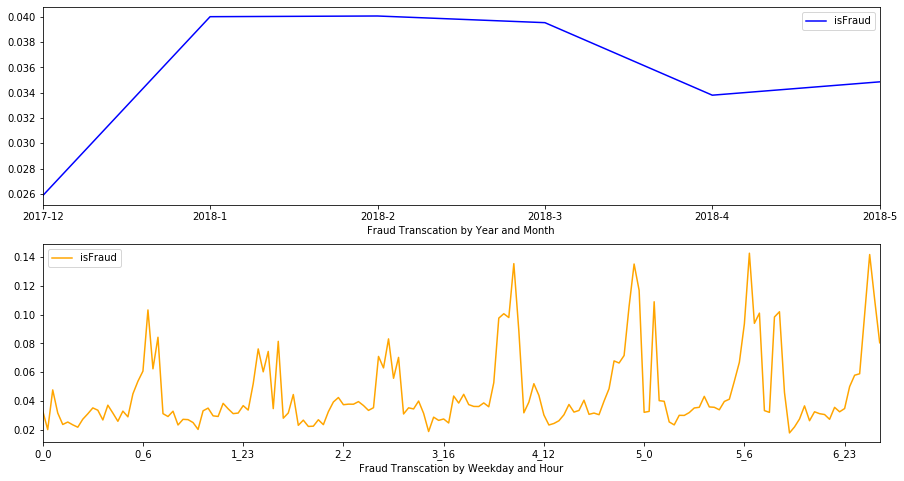

In [16]:
train_trn['year_month'] = train_trn['date'].dt.year.astype(str) + '-' + train_trn['date'].dt.month.astype(str)
train_trn['weekday_hour'] = train_trn['weekdays'].astype(str) + '_' + train_trn['hours'].astype(str)

fig = plt.figure(figsize=(15,8))

ax0 = fig.add_subplot(2, 1, 1) # add subplot 1 
ax1 = fig.add_subplot(2, 1, 2) # add subplot 2 

# Subplot 1
train_trn.groupby('year_month')['isFraud'].mean().to_frame().plot(kind='line', color='blue', ax=ax0)
ax0.set_xlabel('Fraud Transcation by Year and Month')

# Subplot 2
train_trn.groupby('weekday_hour')['isFraud'].mean().to_frame().plot(kind='line', color='orange', ax=ax1)
ax1.set_xlabel('Fraud Transcation by Weekday and Hour')

plt.show()

## TransactionAmt

In [17]:
import plotly.graph_objects as go
fig = go.Figure(data=go.Bar(y=[2, 3, 1]))
fig.write_html('first_figure.html', auto_open=True)
from plotly.subplots import make_subplots

condition = train_trn['isFraud']==1

fig = go.Figure(data=go.Histogram(x=train_trn[condition]['date']))

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=train_trn[condition]['date'], y=train_trn[condition]['TransactionAmt'], name="Fraud Transaction Amount"),
    secondary_y=False,
)

fig.add_trace(
    go.Histogram(x=train_trn[condition]['date'], name="# of Fraud Transaction"),
    secondary_y=True
)

# Add figure title
fig.update_layout(
    title_text="<b>Fraud Transaction Amount and Count by Date</b>"
)

# Set x-axis title
# fig.update_xaxes(title_text="Date")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Fraud Transaction Amount</b>", secondary_y=False)
fig.update_yaxes(title_text="<b># of Fraud Transaction</b>", secondary_y=True)

fig.update_traces(opacity=0.5)


fig.show()

## ProductCD

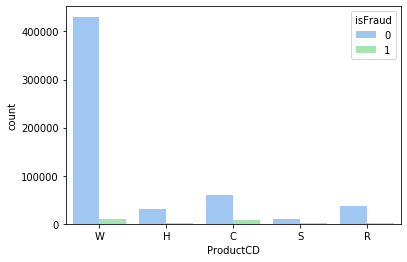

In [18]:
ax = sns.countplot(x="ProductCD", hue="isFraud", data=train_trn)

In [19]:
fig = go.Figure()

fig.add_trace(go.Violin(x=train_trn['ProductCD'][train_trn['isFraud']==0 ],
                        y=train_trn['TransactionAmt'][train_trn['isFraud']==0][train_trn['TransactionAmt']<=500],
                        legendgroup='Non Fraud', scalegroup='Non Fraud', name='Non Fraud',
                        side='negative',
                        line_color='blue')
             )
fig.add_trace(go.Violin(x=train_trn['ProductCD'][train_trn['isFraud']==1 ],
                        y=train_trn['TransactionAmt'][train_trn['isFraud']==1][train_trn['TransactionAmt']<=500],
                        legendgroup='Fraud', scalegroup='Fraud', name='Fraud',
                        side='positive',
                        line_color='orange')
             )
fig.update_traces(meanline_visible=True)
fig.update_layout(violingap=0, violinmode='overlay')
fig.show()

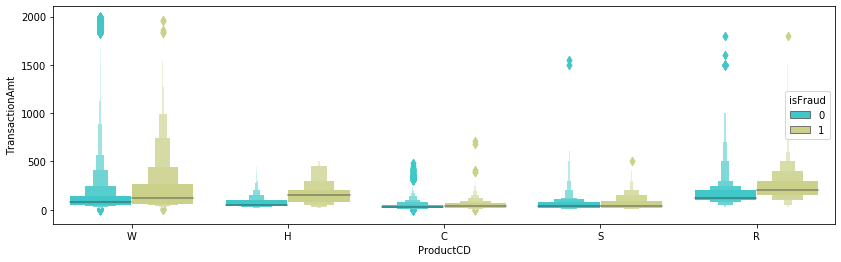

In [20]:
plt.figure(figsize=(14,4))
sns.boxenplot(x="ProductCD", y="TransactionAmt", data=train_trn[train_trn['TransactionAmt'] <= 2000],hue='isFraud',palette='rainbow')
plt.show()

## card 1 - card 6

In [0]:
def create_col_names(base_str, start_int, end_int):
  return [base_str + str(i) for i in range(start_int, end_int+1)]

In [22]:
card_cols = create_col_names('card',1,6)

print('# of null values \n')
print(train_trn[card_cols].isnull().sum())

print('\n\n# of unique values \n')
print(train_trn[card_cols].nunique())

print('\n\n card1 - card6\n')
print(train_trn[card_cols].head(10))

print('\n\n card4\n')
print(train_trn['card4'].value_counts())

print('\n\n card6\n')
print(train_trn['card6'].value_counts())

# of null values 

card1       0
card2    8933
card3    1565
card4    1577
card5    4259
card6    1571
dtype: int64


# of unique values 

card1    13553
card2      500
card3      114
card4        4
card5      119
card6        4
dtype: int64


 card1 - card6

   card1  card2  card3       card4  card5   card6
0  13926    NaN  150.0    discover  142.0  credit
1   2755  404.0  150.0  mastercard  102.0  credit
2   4663  490.0  150.0        visa  166.0   debit
3  18132  567.0  150.0  mastercard  117.0   debit
4   4497  514.0  150.0  mastercard  102.0  credit
5   5937  555.0  150.0        visa  226.0   debit
6  12308  360.0  150.0        visa  166.0   debit
7  12695  490.0  150.0        visa  226.0   debit
8   2803  100.0  150.0        visa  226.0   debit
9  17399  111.0  150.0  mastercard  224.0   debit


 card4

visa                384767
mastercard          189217
american express      8328
discover              6651
Name: card4, dtype: int64


 card6

debit              439938
credit    

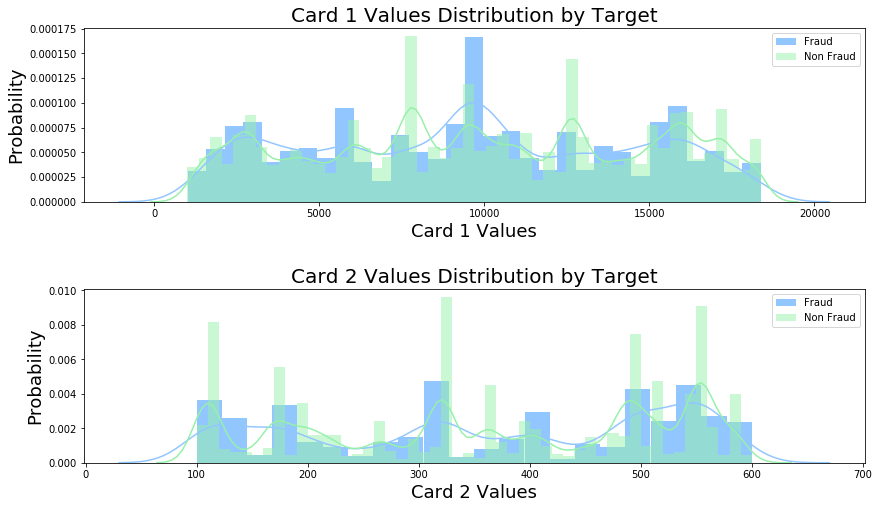

In [23]:
fig = plt.figure(figsize=(14,8))
ax1 = fig.add_subplot(2,1,1)
ax2 = fig.add_subplot(2,1,2)

ax1 = sns.distplot(train_trn[train_trn['isFraud'] == 1]['card1'], label='Fraud', hist_kws=dict(alpha=1),ax=ax1)
ax1 = sns.distplot(train_trn[train_trn['isFraud'] == 0]['card1'], label='Non Fraud', hist_kws=dict(alpha=0.5),ax=ax1)
ax1.legend()
ax1.set_title("Card 1 Values Distribution by Target", fontsize=20)
ax1.set_xlabel("Card 1 Values", fontsize=18)
ax1.set_ylabel("Probability", fontsize=18)

ax2 = sns.distplot(train_trn[train_trn['isFraud'] == 1]['card2'].dropna(), label='Fraud', hist_kws=dict(alpha=1),ax=ax2)
ax2 = sns.distplot(train_trn[train_trn['isFraud'] == 0]['card2'].dropna(), label='Non Fraud', hist_kws=dict(alpha=0.5),ax=ax2)
ax2.legend()
ax2.set_title("Card 2 Values Distribution by Target", fontsize=20)
ax2.set_xlabel("Card 2 Values", fontsize=18)
ax2.set_ylabel("Probability", fontsize=18)

plt.subplots_adjust(hspace = 0.5)
plt.show()

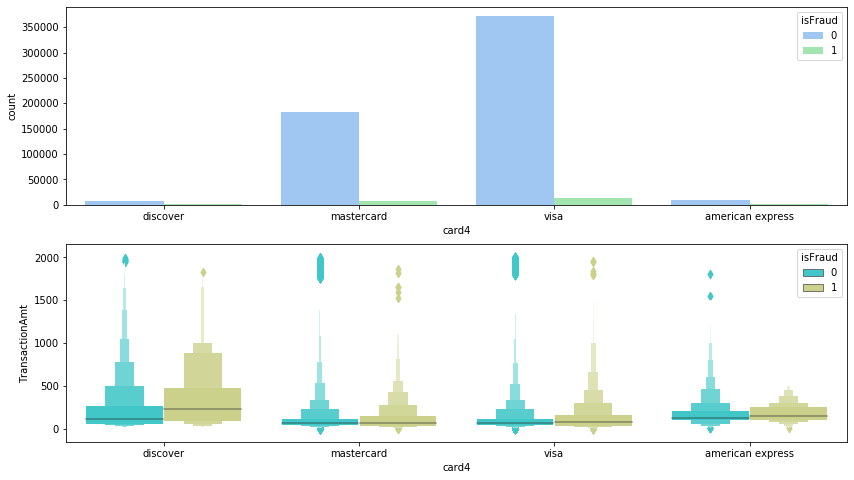

In [24]:
fig = plt.figure(figsize=(14,8))
ax1 = fig.add_subplot(2,1,1)
ax2 = fig.add_subplot(2,1,2)

sns.countplot(x="card4", hue="isFraud", data=train_trn, ax=ax1)
sns.boxenplot(x="card4", y="TransactionAmt", data=train_trn[train_trn['TransactionAmt'] <= 2000],hue='isFraud',palette='rainbow', ax=ax2)

plt.show()


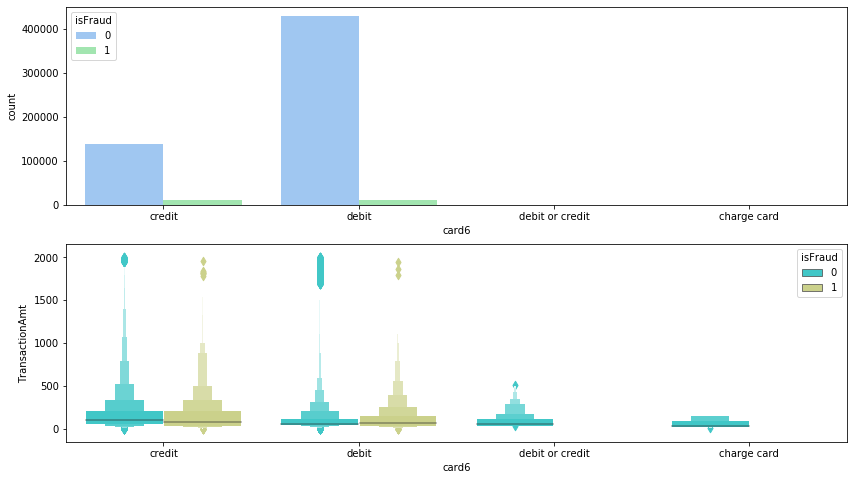

In [25]:
fig = plt.figure(figsize=(14,8))
ax1 = fig.add_subplot(2,1,1)
ax2 = fig.add_subplot(2,1,2)

ax1 = sns.countplot(x="card6", hue="isFraud", data=train_trn, ax=ax1)
ax2 = sns.boxenplot(x="card6", y="TransactionAmt", data=train_trn[train_trn['TransactionAmt'] <= 2000],hue='isFraud',palette='rainbow', ax=ax2)

plt.show()

## addr1, addr2

In [26]:
train_trn[['addr1','addr2']].sample(5)

,addr1,addr2
493592,272.0,87.0
233027,272.0,87.0
304650,126.0,87.0
283754,325.0,87.0
93793,441.0,87.0


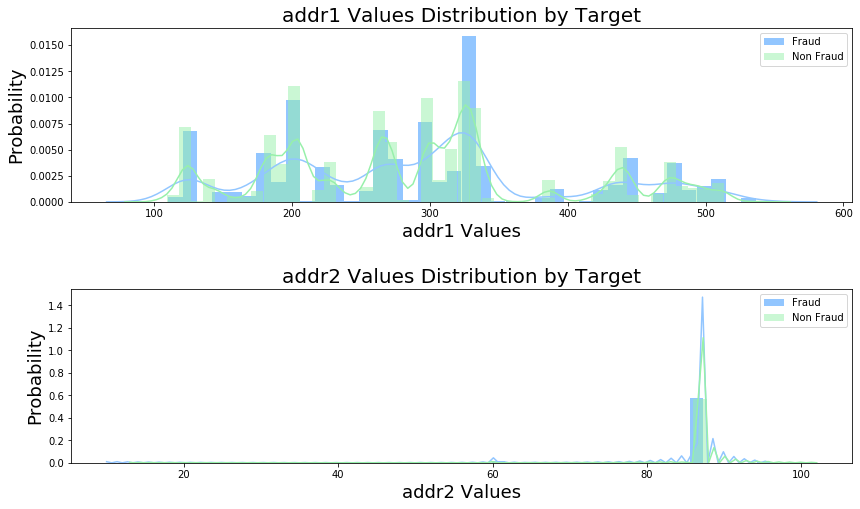

In [27]:
fig = plt.figure(figsize=(14,8))
ax1 = fig.add_subplot(2,1,1)
ax2 = fig.add_subplot(2,1,2)

ax1 = sns.distplot(train_trn[train_trn['isFraud'] == 1]['addr1'].dropna(), label='Fraud', hist_kws=dict(alpha=1),ax=ax1)
ax1 = sns.distplot(train_trn[train_trn['isFraud'] == 0]['addr1'].dropna(), label='Non Fraud', hist_kws=dict(alpha=0.5),ax=ax1)
ax1.legend()
ax1.set_title("addr1 Values Distribution by Target", fontsize=20)
ax1.set_xlabel("addr1 Values", fontsize=18)
ax1.set_ylabel("Probability", fontsize=18)

ax2 = sns.distplot(train_trn[train_trn['isFraud'] == 1]['addr2'].dropna(), label='Fraud', hist_kws=dict(alpha=1),ax=ax2)
ax2 = sns.distplot(train_trn[train_trn['isFraud'] == 0]['addr2'].dropna(), label='Non Fraud', hist_kws=dict(alpha=0.5),ax=ax2)
ax2.legend()
ax2.set_title("addr2 Values Distribution by Target", fontsize=20)
ax2.set_xlabel("addr2 Values", fontsize=18)
ax2.set_ylabel("Probability", fontsize=18)

plt.subplots_adjust(hspace = 0.5)
plt.show()

## C1 - C14

In [28]:
c_cols = create_col_names('C',1,14)

train_trn[c_cols].describe()

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14
count,590540.0,590540.0,590540.000000,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0,590540.0
mean,NaN,NaN,0.005650,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,0.150635,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN
min,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,1.0,1.0,0.000000,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0
50%,1.0,1.0,0.000000,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,3.0,1.0
75%,3.0,3.0,0.000000,0.0,1.0,2.0,0.0,0.0,2.0,0.0,2.0,0.0,12.0,2.0
max,4684.0,5692.0,26.000000,2252.0,349.0,2252.0,2256.0,3332.0,210.0,3256.0,3188.0,3188.0,2918.0,1429.0


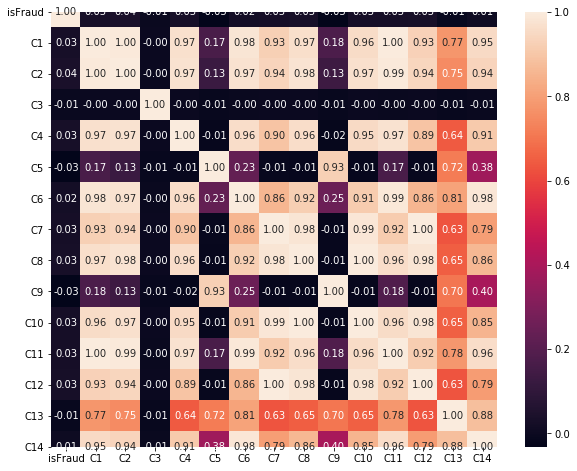

In [29]:
plt.figure(figsize=(10,8))

corr = train_trn[['isFraud'] + c_cols].corr()
sns.heatmap(corr, annot=True, fmt='.2f')

## D1-D15

In [30]:
d_cols = create_col_names('D',1,15)

train_trn[d_cols].describe()

,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15
count,589271.0,309743.0,327662.0,421618.0,280699.0,73187.0,38917.0,74926.000000,74926.000000,514518.0,311253.0,64717.0,61952.0,62187.0,501427.0
mean,NaN,NaN,NaN,NaN,NaN,NaN,inf,NaN,0.560059,NaN,NaN,inf,inf,inf,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,inf,NaN,0.316650,NaN,NaN,inf,inf,inf,NaN
min,0.0,0.0,0.0,-122.0,0.0,-83.0,0.0,0.000000,0.000000,0.0,-53.0,-83.0,0.0,-193.0,-83.0
25%,0.0,26.0,1.0,0.0,1.0,0.0,0.0,0.958496,0.208374,0.0,0.0,0.0,0.0,0.0,0.0
50%,3.0,97.0,8.0,26.0,10.0,0.0,0.0,37.875000,0.666504,15.0,43.0,0.0,0.0,0.0,52.0
75%,122.0,276.0,27.0,253.0,32.0,40.0,17.0,188.000000,0.833496,197.0,274.0,13.0,0.0,2.0,314.0
max,640.0,640.0,819.0,869.0,819.0,873.0,843.0,1708.000000,0.958496,876.0,670.0,648.0,847.0,878.0,879.0


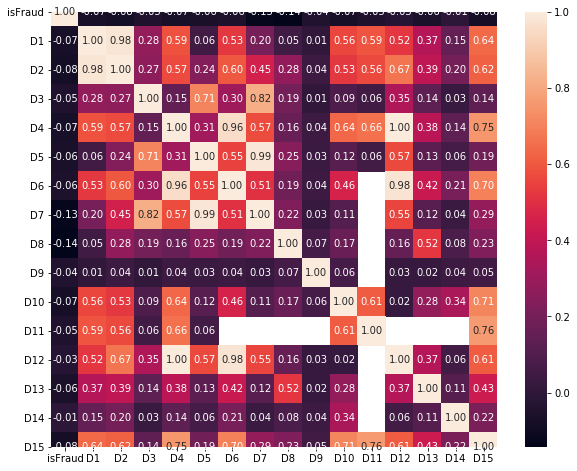

In [31]:
plt.figure(figsize=(10,8))

corr = train_trn[['isFraud'] + d_cols].corr()
sns.heatmap(corr, annot=True, fmt='.2f')

## M1 - M9


In [32]:
m_cols = create_col_names('M',1,9)

train_trn[m_cols].describe()

,M1,M2,M3,M4,M5,M6,M7,M8,M9
count,319440,319440,319440,309096,240058,421180,244275,244288,244288
unique,2,2,2,3,2,2,2,2,2
top,T,T,T,M0,F,F,F,F,T
freq,319415,285468,251731,196405,132491,227856,211374,155251,205656


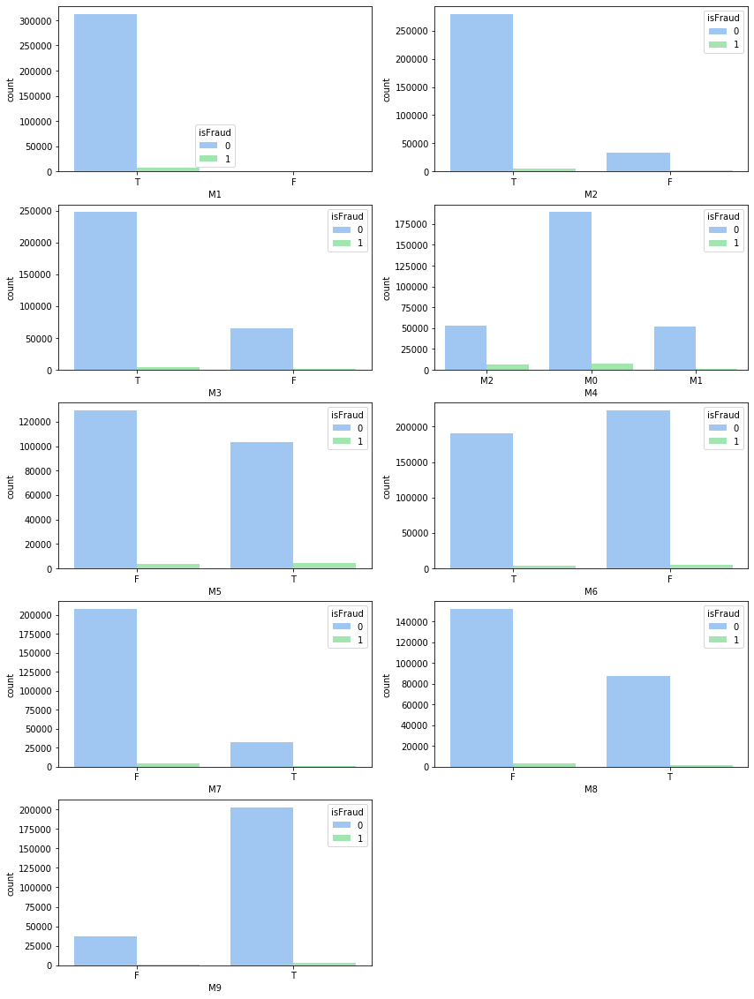

In [33]:
fig = plt.figure(figsize=(14,20))

ax1 = fig.add_subplot(5,2,1)
ax2 = fig.add_subplot(5,2,2)
ax3 = fig.add_subplot(5,2,3)
ax4 = fig.add_subplot(5,2,4)
ax5 = fig.add_subplot(5,2,5)
ax6 = fig.add_subplot(5,2,6)
ax7 = fig.add_subplot(5,2,7)
ax8 = fig.add_subplot(5,2,8)
ax9 = fig.add_subplot(5,2,9)

sns.countplot(x='M1', hue='isFraud', data=train_trn, ax=ax1)
sns.countplot(x='M2', hue='isFraud', data=train_trn, ax=ax2)
sns.countplot(x='M3', hue='isFraud', data=train_trn, ax=ax3)
sns.countplot(x='M4', hue='isFraud', data=train_trn, ax=ax4)
sns.countplot(x='M5', hue='isFraud', data=train_trn, ax=ax5)
sns.countplot(x='M6', hue='isFraud', data=train_trn, ax=ax6)
sns.countplot(x='M7', hue='isFraud', data=train_trn, ax=ax7)
sns.countplot(x='M8', hue='isFraud', data=train_trn, ax=ax8)
sns.countplot(x='M9', hue='isFraud', data=train_trn, ax=ax9)


plt.show()


## DeviceType

desktop    85165
mobile     55645
Name: DeviceType, dtype: int64


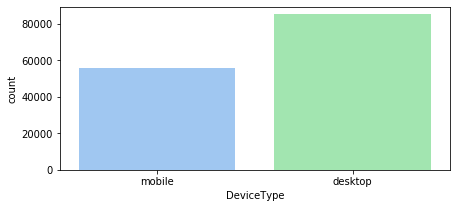

In [34]:
print(train_id['DeviceType'].value_counts())

fig = plt.figure(figsize=(7,3))
sns.countplot(x='DeviceType',data=train_id)
plt.show()

# Machine Learning

In [0]:
def display_scores(scores):
    print("Scores: {0}\nMean: {1:.3f}\nStd: {2:.3f}".format(scores, np.mean(scores), np.std(scores)))


def report_best_scores(results, n_top=3):
    for i in range(1, n_top + 1):
        candidates = np.flatnonzero(results['rank_test_score'] == i)
        for candidate in candidates:
            print("Model with rank: {0}".format(i))
            print("Mean validation score: {0:.3f} (std: {1:.3f})".format(
                  results['mean_test_score'][candidate],
                  results['std_test_score'][candidate]))
            print("Parameters: {0}".format(results['params'][candidate]))
            print("")

In [0]:
# drop columns for merging data frames for machine learning
train_trn.drop(['date','days','weekdays','hours','year_month','weekday_hour'],axis=1,inplace=True)
train_id.drop(['DeviceInfo'],axis=1, inplace=True)
test_id.drop(['DeviceInfo'],axis=1, inplace=True)

In [37]:
%%time

train = train_trn.merge(train_id, how='left', left_index=True, right_index=True)
X_test = test_trn.merge(test_id, how='left', left_index=True, right_index=True)

print('The shape of training data is {}.'.format(train.shape))
print('The shape of testing data is {}.'.format(X_test.shape))

y_train = train['isFraud'].copy()
X_train = train.drop('isFraud', axis=1)

# Label Encoding
for f in X_train.columns:
    if X_train[f].dtype=='object' or X_test[f].dtype=='object': 
        lbl = preprocessing.LabelEncoder()
        lbl.fit(list(X_train[f].values) + list(X_test[f].values))
        X_train[f] = lbl.transform(list(X_train[f].values))
        X_test[f] = lbl.transform(list(X_test[f].values))



The shape of training data is (590540, 434).
The shape of testing data is (506691, 433).
CPU times: user 54.7 s, sys: 602 ms, total: 55.3 s
Wall time: 55.3 s


In [0]:
del train, train_trn, train_id, test_trn, test_id

In [39]:
%%time
from sklearn.model_selection import KFold
from sklearn.metrics import roc_auc_score
EPOCHS = 5
kf = KFold(n_splits = EPOCHS, shuffle = True, random_state = 7)
y_preds = np.zeros(sample_submission.shape[0])
y_oof = np.zeros(X_train.shape[0])
for tr_idx, val_idx in kf.split(X_train, y_train):
    clf = xgb.XGBClassifier(
        n_estimators=500,
        max_depth=9,
        learning_rate=0.05,
        subsample=0.9,
        colsample_bytree=0.9,
        tree_method='gpu_hist'
    )
    
    X_tr, X_vl = X_train.iloc[tr_idx, :], X_train.iloc[val_idx, :]
    y_tr, y_vl = y_train.iloc[tr_idx], y_train.iloc[val_idx]
    clf.fit(X_tr, y_tr)
    y_pred_train = clf.predict_proba(X_vl)[:,1]
    y_oof[val_idx] = y_pred_train
    print('ROC AUC {}'.format(roc_auc_score(y_vl, y_pred_train)))
    
    y_preds+= clf.predict_proba(X_test)[:,1] / EPOCHS

ROC AUC 0.9682073901956838
ROC AUC 0.9626269829265434
ROC AUC 0.9594966725571192
ROC AUC 0.9610760549336101
ROC AUC 0.9599044895323428
CPU times: user 38min 12s, sys: 27min 31s, total: 1h 5min 43s
Wall time: 1h 5min 43s


In [0]:
sample_submission['isFraud'] = y_preds
sample_submission.to_csv('simple_xgboost.csv')

In [0]:
%%time
'''kfold = KFold(n_splits = 10, random_state = 7)
model = xgb.XGBClassifier(
        n_estimators=500,
        max_depth=9,
        learning_rate=0.05,
        subsample=0.9,
        colsample_bytree=0.9,
        tree_method='gpu_hist'
    )
result = cross_val_score(model, X_train, y_train, cv = kfold, scoring="roc_auc")''''''


#EPOCHS = 5
#kf = KFold(n_splits = EPOCHS, shuffle = True)
#y_preds = np.zeros(sample_submission.shape[0])
#y_oof = np.zeros(X_train.shape[0])
#for tr_idx, val_idx in kf.split(X_train, y_train):
 #   clf = xgb.XGBClassifier(
  #      n_estimators=500,
#        max_depth=9,
#        learning_rate=0.05,
#        subsample=0.9,
#        colsample_bytree=0.9,
#        tree_method='gpu_hist'
#    )
    
#    X_tr, X_vl = X_train.iloc[tr_idx, :], X_train.iloc[val_idx]
##    y_tr, y_vl = y_train.iloc[tr_idx], y_train.iloc[val_idx]
 #   clf.fit(X_tr, y_tr)
#    y_pred_train = clf.predict_proba(X_vl)[:,1]
 #   y_oof[val_idx] = y_pred_train
 #   print('ROC AUC {}'.format(roc_auc_score(y_vl, y_pred_train)))
    
 #   y_preds+= clf.predict_proba(X_test)[:,1] / EPOCHS
 